This script tries to apply Semantic Segmentation Algorithm to driving scene images. The used dataset is the one below:

https://www.kaggle.com/datasets/dansbecker/cityscapes-image-pairs

An accuracy of 73.5% is reached using U-Net as Neural Network architecture

Neural Network Architecture Reference:

Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "U-net: Convolutional networks for biomedical image segmentation." Medical Image Computing and Computer-Assisted Intervention–MICCAI 2015: 18th International Conference, Munich, Germany, October 5-9, 2015, Proceedings, Part III 18. Springer International Publishing, 2015.

Article Resource: https://arxiv.org/abs/1505.04597

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Layer
from tensorflow.keras import initializers

from keras import backend as K
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2

In [ ]:
###########TRAINING
def preprocess_images(path: str):
    X = []
    Y = []
    directory = path
    for image in os.listdir(directory):
        img = cv2.imread(directory+image)
        #Train
        cropped_image_train = img[0:256, 0:256]
        X.append(cropped_image_train)
        #Validation
        cropped_image_valid = img[0:256, 256:512]
        Y.append(cropped_image_valid)
    return X, Y

In [ ]:
X_train, Y_train = preprocess_images("/kaggle/input/cityscapes-image-pairs/cityscapes_data/train/")

In [ ]:

X_valid, Y_valid = preprocess_images("/kaggle/input/cityscapes-image-pairs/cityscapes_data/val/")

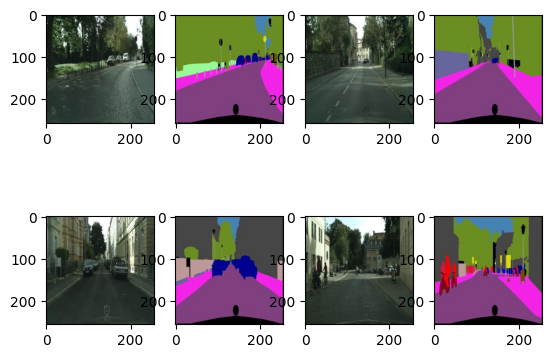

In [ ]:
plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(X_train[0], cv2.COLOR_BGR2RGB))
plt.subplot(2, 4, 2)
plt.imshow(cv2.cvtColor(Y_train[0], cv2.COLOR_BGR2RGB))
plt.subplot(2, 4, 3)
plt.imshow(cv2.cvtColor(X_train[1], cv2.COLOR_BGR2RGB))
plt.subplot(2, 4, 4)
plt.imshow(cv2.cvtColor(Y_train[1], cv2.COLOR_BGR2RGB))
plt.subplot(2, 4, 5)
plt.imshow(cv2.cvtColor(X_train[2], cv2.COLOR_BGR2RGB))
plt.subplot(2, 4, 6)
plt.imshow(cv2.cvtColor(Y_train[2], cv2.COLOR_BGR2RGB))
plt.subplot(2, 4, 7)
plt.imshow(cv2.cvtColor(X_train[3], cv2.COLOR_BGR2RGB))
plt.subplot(2, 4, 8)
plt.imshow(cv2.cvtColor(Y_train[3], cv2.COLOR_BGR2RGB))

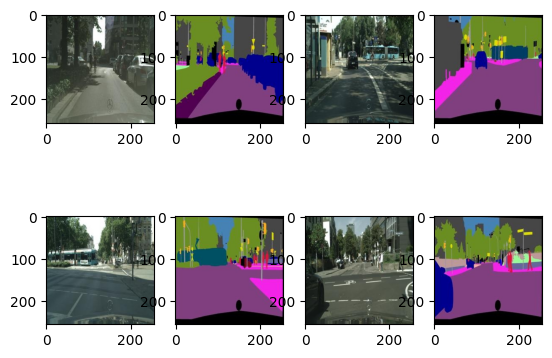

In [ ]:
plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(X_valid[0], cv2.COLOR_BGR2RGB))
plt.subplot(2, 4, 2)
plt.imshow(cv2.cvtColor(Y_valid[0], cv2.COLOR_BGR2RGB))
plt.subplot(2, 4, 3)
plt.imshow(cv2.cvtColor(X_valid[1], cv2.COLOR_BGR2RGB))
plt.subplot(2, 4, 4)
plt.imshow(cv2.cvtColor(Y_valid[1], cv2.COLOR_BGR2RGB))
plt.subplot(2, 4, 5)
plt.imshow(cv2.cvtColor(X_valid[2], cv2.COLOR_BGR2RGB))
plt.subplot(2, 4, 6)
plt.imshow(cv2.cvtColor(Y_valid[2], cv2.COLOR_BGR2RGB))
plt.subplot(2, 4, 7)
plt.imshow(cv2.cvtColor(X_valid[3], cv2.COLOR_BGR2RGB))
plt.subplot(2, 4, 8)
plt.imshow(cv2.cvtColor(Y_valid[3], cv2.COLOR_BGR2RGB))

In [ ]:
X_train = np.array(X_train).astype('float32')/255.0
Y_train = np.array(Y_train).astype('float32')/255.0

print(X_train.shape)
print(Y_train.shape)

(2975, 256, 256, 3)
(2975, 256, 256, 3)


In [ ]:
X_valid = np.array(X_valid).astype('float32')/255.0
Y_valid = np.array(Y_valid).astype('float32')/255.0

print(X_valid.shape)
print(Y_valid.shape)

(500, 256, 256, 3)
(500, 256, 256, 3)


In [ ]:

#Let's build U-Net

class EncodingLayer(Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.conv0 = tf.keras.layers.Conv2D(64, 3, padding = "same", activation='relu', kernel_initializer='he_normal')
        self.conv1 = tf.keras.layers.Conv2D(64, 3, padding = "same", activation='relu', kernel_initializer='he_normal')  #to be forwarded
        self.batc0 = tf.keras.layers.BatchNormalization()
        self.maxp0 = tf.keras.layers.MaxPool2D(pool_size=(2,2))

        self.conv2 = tf.keras.layers.Conv2D(128, 3, padding = "same", activation='relu', kernel_initializer='he_normal')
        self.conv3 = tf.keras.layers.Conv2D(128, 3, padding = "same", activation='relu', kernel_initializer='he_normal') #to be forwarded
        self.batc1 = tf.keras.layers.BatchNormalization()
        self.maxp1 = tf.keras.layers.MaxPool2D(pool_size=(2,2))

        self.conv4 = tf.keras.layers.Conv2D(256, 3, padding = "same", activation='relu', kernel_initializer='he_normal')
        self.conv5 = tf.keras.layers.Conv2D(256, 3, padding = "same", activation='relu', kernel_initializer='he_normal') #to be forwarded
        self.batc2 = tf.keras.layers.BatchNormalization()
        self.maxp2 = tf.keras.layers.MaxPool2D(pool_size=(2,2))

        self.conv6 = tf.keras.layers.Conv2D(512, 3, padding = "same", activation='relu', kernel_initializer='he_normal')
        self.conv7 = tf.keras.layers.Conv2D(512, 3, padding = "same", activation='relu', kernel_initializer='he_normal') #to be forwarded
        self.batc3 = tf.keras.layers.BatchNormalization()
        self.maxp3 = tf.keras.layers.MaxPool2D(pool_size=(2,2))

        self.conv8 = tf.keras.layers.Conv2D(1024, 3, padding = "same", activation='relu', kernel_initializer='he_normal')
        self.conv9 = tf.keras.layers.Conv2D(512, 3,  padding = "same", activation='relu', kernel_initializer='he_normal')

        self.batc4 = tf.keras.layers.BatchNormalization()

    def call(self, inputs):
        x00 = inputs
        x01 = self.conv0(x00)
        x02 = self.conv1(x01) #to be forwarded
        b00 = self.batc0(x02)
        x03 = self.maxp0(b00)
        x04 = self.conv2(x03)
        x05 = self.conv3(x04) #to be forwarded
        b01 = self.batc1(x05)
        x06 = self.maxp1(b01)
        x07 = self.conv4(x06)
        x08 = self.conv5(x07) #to be forwarded
        b02 = self.batc2(x08)
        x09 = self.maxp2(b02)
        x10 = self.conv6(x09)
        x11 = self.conv7(x10) #to be forwarded
        b03 = self.batc3(x11)
        x12 = self.maxp3(b03)
        x13 = self.conv8(x12)
        x14 = self.conv9(x13) #to be forwarded
        b04 = self.batc4(x14)
        return x02, x05, x08, x11, b04

In [ ]:
class DecodingLayer(Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.conU0 = tf.keras.layers.UpSampling2D(2)
        self.conc0 = tf.keras.layers.Concatenate()
        self.batc0 = tf.keras.layers.BatchNormalization()

        self.conv0 = tf.keras.layers.Conv2D(512, 3, padding = "same", activation='relu', kernel_initializer='he_normal')
        self.conv1 = tf.keras.layers.Conv2D(256, 3, padding = "same", activation='relu', kernel_initializer='he_normal')
        self.conU1 = tf.keras.layers.UpSampling2D(2)
        self.conc1 = tf.keras.layers.Concatenate()
        self.batc1 = tf.keras.layers.BatchNormalization()

        self.conv2 = tf.keras.layers.Conv2D(256, 3, padding = "same", activation='relu', kernel_initializer='he_normal')
        self.conv3 = tf.keras.layers.Conv2D(128, 3, padding = "same", activation='relu', kernel_initializer='he_normal')
        self.conU2 = tf.keras.layers.UpSampling2D(2)
        self.conc2 = tf.keras.layers.Concatenate()
        self.batc2 = tf.keras.layers.BatchNormalization()

        self.conv4 = tf.keras.layers.Conv2D(128, 3, padding = "same", activation='relu', kernel_initializer='he_normal')
        self.conv5 = tf.keras.layers.Conv2D(64, 3,  padding = "same", activation='relu', kernel_initializer='he_normal')
        self.conU3 = tf.keras.layers.UpSampling2D(2)
        self.conc3 = tf.keras.layers.Concatenate()
        self.batc3 = tf.keras.layers.BatchNormalization()

        self.conv6 = tf.keras.layers.Conv2D(64, 3, padding = "same", activation='relu', kernel_initializer='he_normal')
        self.conv7 = tf.keras.layers.Conv2D(64, 3, padding = "same", activation='relu', kernel_initializer='he_normal')
        self.batc4 = tf.keras.layers.BatchNormalization()
        self.conv8 = tf.keras.layers.Conv2D(3, 1, activation = "sigmoid")

    def call(self, inputs):
        x00 = self.conU0(inputs[4])
        x01 = self.conc0([x00, inputs[3]])
        b00 = self.batc0(x01)
        x02 = self.conv0(b00)
        x03 = self.conv1(x02)
        x03 = self.conU1(x03)
        x04 = self.conc1([x03, inputs[2]])
        b01 = self.batc1(x04)
        x05 = self.conv2(b01)
        x06 = self.conv3(x05)
        x07 = self.conU2(x06)
        x08 = self.conc2([x07, inputs[1]])
        b02 = self.batc2(x08)
        x09 = self.conv4(b02)
        x10 = self.conv5(x09)
        x11 = self.conU3(x10)
        x12 = self.conc3([x11, inputs[0]])
        b03 = self.batc3(x12)
        x13 = self.conv6(b03)
        x14 = self.conv7(x13)
        b04 = self.batc4(x14)
        x15 = self.conv8(b04)
        return x15

In [ ]:
class U_Net(tf.keras.Model):
    def __init__(self):
        super(U_Net, self).__init__()
        self.encoding = EncodingLayer()
        self.decoding = DecodingLayer()

    def call(self, inputs):
        self.out1 = self.encoding(inputs)
        self.out2 = self.decoding(self.out1)
        return self.out2

In [ ]:
class EarlyStop(keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if logs.get('accuracy') is not None and \
    logs.get('val_accuracy') is not None and \
    logs.get('accuracy') > 0.73 and \
    logs.get('val_accuracy')  > 0.73:
      print("\nReached wanted accuracy so cancelling training!")
      self.model.stop_training = True

In [ ]:
class ShowProgress(keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    id = np.random.randint(len(X_valid))
    rand_img = X_valid[id][np.newaxis,...]
    pred_mask = self.model.predict(rand_img)[0]
    true_mask = Y_valid[id]


    plt.subplot(1,3,1)
    plt.imshow(rand_img[0])
    plt.title("Original Image")
    plt.axis('off')


    plt.subplot(1,3,2)
    plt.imshow(pred_mask)
    plt.title("Output Mask")
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.imshow(true_mask)
    plt.title("Ground Truth")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
show_progress = ShowProgress()
early_stop = EarlyStop()

In [ ]:
model = U_Net()


model.compile(
        loss='binary_crossentropy',
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
        metrics=['accuracy', keras.metrics.MeanIoU(num_classes=2)])

Epoch 1/100
 6/93 [>.............................] - ETA: 18s - loss: 0.7521 - accuracy: 0.4371 - mean_io_u_1: 0.4998

1/1 [==============================] - 1s 673ms/step


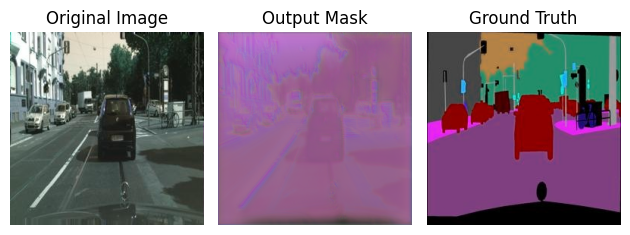

93/93 [==============================] - 45s 382ms/step - loss: 0.6355 - accuracy: 0.5182 - mean_io_u_1: 0.4998 - val_loss: 0.6961 - val_accuracy: 0.3598 - val_mean_io_u_1: 0.4999
Epoch 2/100
1/1 [==============================] - 0s 22ms/step


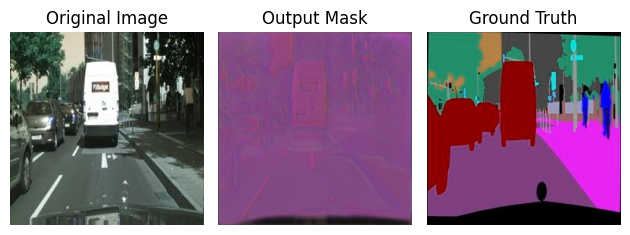

93/93 [==============================] - 21s 221ms/step - loss: 0.5859 - accuracy: 0.5736 - mean_io_u_1: 0.4998 - val_loss: 0.6489 - val_accuracy: 0.4776 - val_mean_io_u_1: 0.4999
Epoch 3/100
1/1 [==============================] - 0s 21ms/step


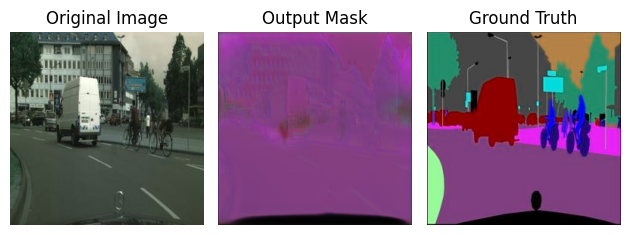

93/93 [==============================] - 21s 224ms/step - loss: 0.5664 - accuracy: 0.6023 - mean_io_u_1: 0.4998 - val_loss: 0.6436 - val_accuracy: 0.3521 - val_mean_io_u_1: 0.4999
Epoch 4/100
1/1 [==============================] - 0s 22ms/step


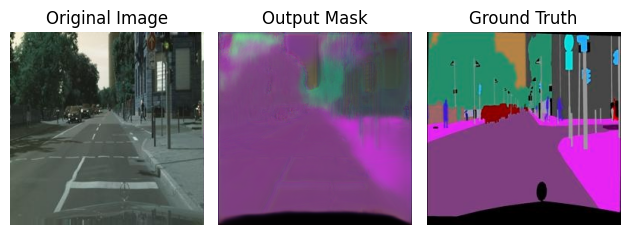

93/93 [==============================] - 21s 222ms/step - loss: 0.5609 - accuracy: 0.6179 - mean_io_u_1: 0.4998 - val_loss: 0.6049 - val_accuracy: 0.5387 - val_mean_io_u_1: 0.4999
Epoch 5/100
1/1 [==============================] - 0s 22ms/step


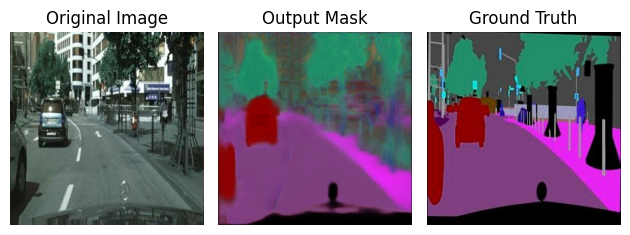

93/93 [==============================] - 21s 221ms/step - loss: 0.5582 - accuracy: 0.6237 - mean_io_u_1: 0.4998 - val_loss: 0.5785 - val_accuracy: 0.6428 - val_mean_io_u_1: 0.4999
Epoch 6/100
1/1 [==============================] - 0s 21ms/step


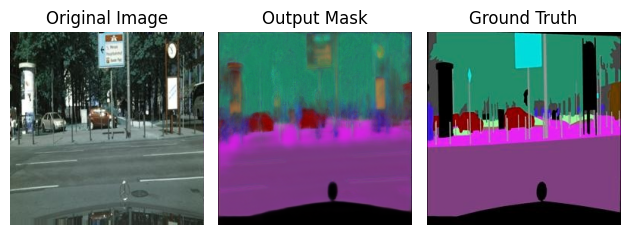

93/93 [==============================] - 21s 221ms/step - loss: 0.5562 - accuracy: 0.6439 - mean_io_u_1: 0.4998 - val_loss: 0.5626 - val_accuracy: 0.7106 - val_mean_io_u_1: 0.4999
Epoch 7/100
1/1 [==============================] - 0s 21ms/step


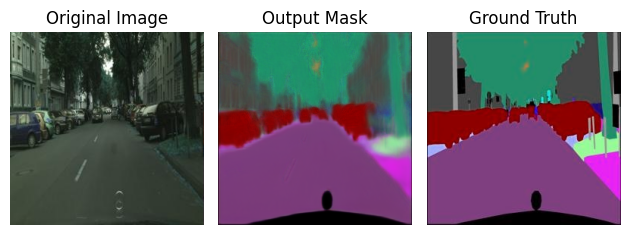

93/93 [==============================] - 21s 221ms/step - loss: 0.5546 - accuracy: 0.6329 - mean_io_u_1: 0.4998 - val_loss: 0.5591 - val_accuracy: 0.6415 - val_mean_io_u_1: 0.4999
Epoch 8/100
1/1 [==============================] - 0s 23ms/step


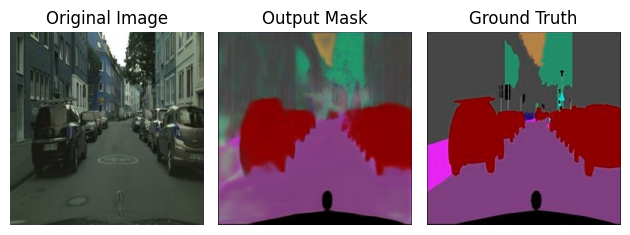

93/93 [==============================] - 21s 221ms/step - loss: 0.5534 - accuracy: 0.6433 - mean_io_u_1: 0.4998 - val_loss: 0.5739 - val_accuracy: 0.5509 - val_mean_io_u_1: 0.4999
Epoch 9/100
1/1 [==============================] - 0s 22ms/step


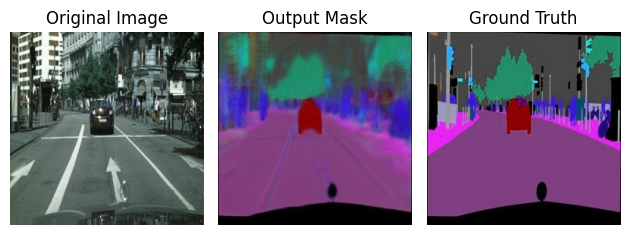

93/93 [==============================] - 21s 221ms/step - loss: 0.5520 - accuracy: 0.6473 - mean_io_u_1: 0.4998 - val_loss: 0.5568 - val_accuracy: 0.5225 - val_mean_io_u_1: 0.4999
Epoch 10/100
1/1 [==============================] - 0s 22ms/step


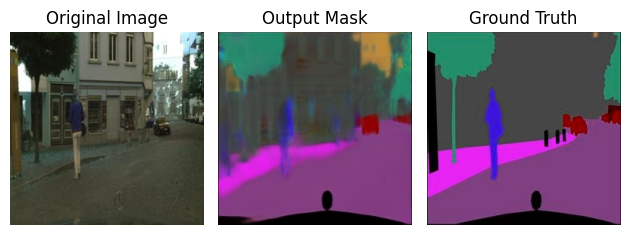

93/93 [==============================] - 21s 221ms/step - loss: 0.5508 - accuracy: 0.6358 - mean_io_u_1: 0.4998 - val_loss: 0.5552 - val_accuracy: 0.5280 - val_mean_io_u_1: 0.4999
Epoch 11/100
1/1 [==============================] - 0s 23ms/step


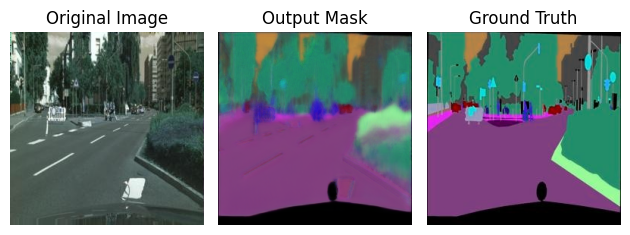

93/93 [==============================] - 21s 222ms/step - loss: 0.5494 - accuracy: 0.6542 - mean_io_u_1: 0.4998 - val_loss: 0.5564 - val_accuracy: 0.5314 - val_mean_io_u_1: 0.4999
Epoch 12/100
1/1 [==============================] - 0s 21ms/step


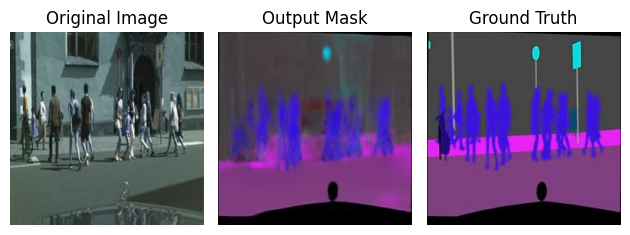

93/93 [==============================] - 21s 222ms/step - loss: 0.5485 - accuracy: 0.6439 - mean_io_u_1: 0.4998 - val_loss: 0.5547 - val_accuracy: 0.6700 - val_mean_io_u_1: 0.4999
Epoch 13/100
1/1 [==============================] - 0s 22ms/step


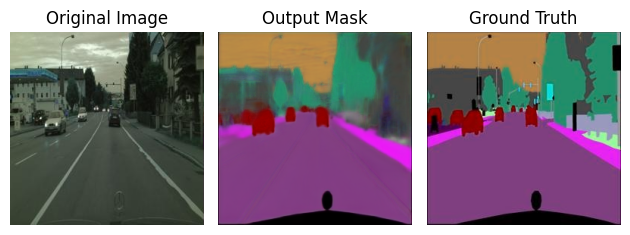

93/93 [==============================] - 21s 221ms/step - loss: 0.5473 - accuracy: 0.6463 - mean_io_u_1: 0.4998 - val_loss: 0.5554 - val_accuracy: 0.6132 - val_mean_io_u_1: 0.4999
Epoch 14/100
1/1 [==============================] - 0s 22ms/step


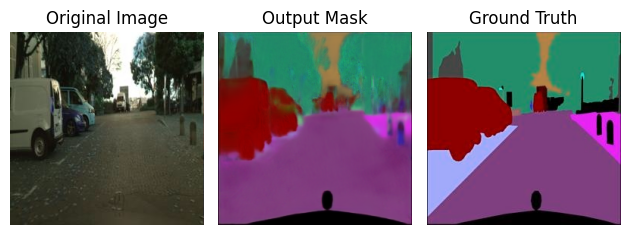

93/93 [==============================] - 21s 221ms/step - loss: 0.5465 - accuracy: 0.6553 - mean_io_u_1: 0.4998 - val_loss: 0.5524 - val_accuracy: 0.5204 - val_mean_io_u_1: 0.4999
Epoch 15/100
1/1 [==============================] - 0s 23ms/step


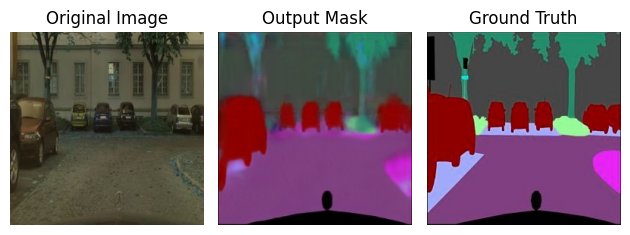

93/93 [==============================] - 21s 221ms/step - loss: 0.5447 - accuracy: 0.6504 - mean_io_u_1: 0.4998 - val_loss: 0.5527 - val_accuracy: 0.5847 - val_mean_io_u_1: 0.4999
Epoch 16/100
1/1 [==============================] - 0s 22ms/step


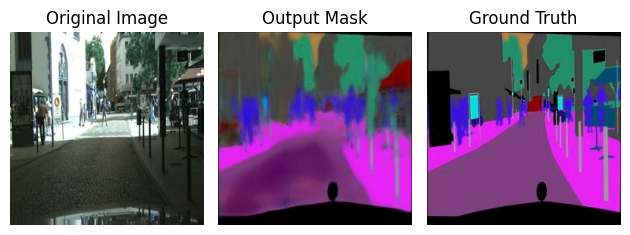

93/93 [==============================] - 21s 222ms/step - loss: 0.5439 - accuracy: 0.6561 - mean_io_u_1: 0.4998 - val_loss: 0.5544 - val_accuracy: 0.5307 - val_mean_io_u_1: 0.4999
Epoch 17/100
1/1 [==============================] - 0s 22ms/step


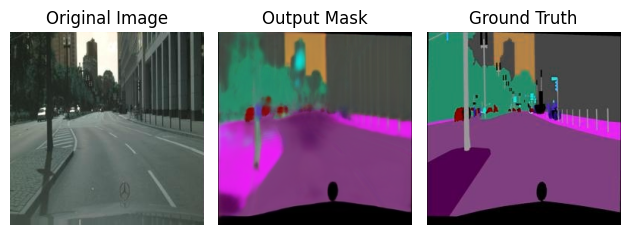

93/93 [==============================] - 21s 221ms/step - loss: 0.5431 - accuracy: 0.6523 - mean_io_u_1: 0.4998 - val_loss: 0.5574 - val_accuracy: 0.5236 - val_mean_io_u_1: 0.4999
Epoch 18/100
1/1 [==============================] - 0s 23ms/step


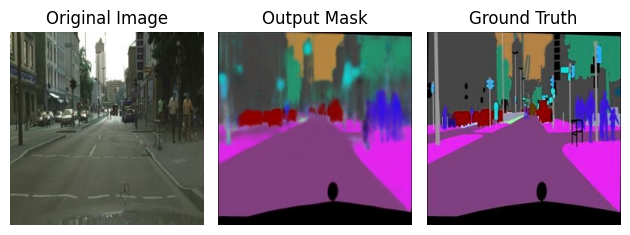

93/93 [==============================] - 21s 222ms/step - loss: 0.5418 - accuracy: 0.6523 - mean_io_u_1: 0.4998 - val_loss: 0.5547 - val_accuracy: 0.5481 - val_mean_io_u_1: 0.4999
Epoch 19/100
1/1 [==============================] - 0s 22ms/step


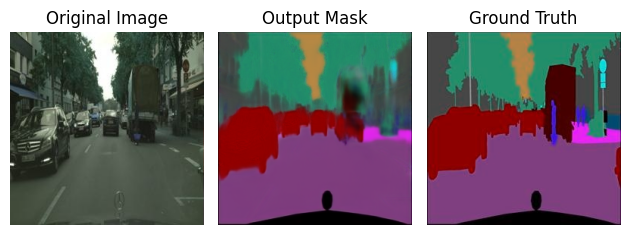

93/93 [==============================] - 21s 221ms/step - loss: 0.5409 - accuracy: 0.6632 - mean_io_u_1: 0.4998 - val_loss: 0.5526 - val_accuracy: 0.5958 - val_mean_io_u_1: 0.4999
Epoch 20/100
1/1 [==============================] - 0s 22ms/step


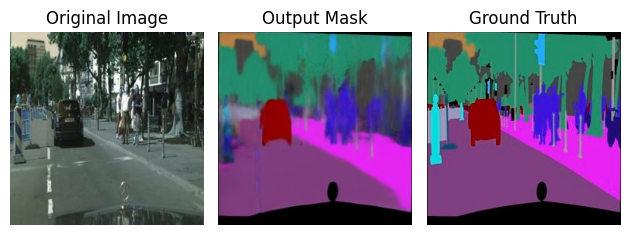

93/93 [==============================] - 21s 221ms/step - loss: 0.5395 - accuracy: 0.6580 - mean_io_u_1: 0.4998 - val_loss: 0.5528 - val_accuracy: 0.6196 - val_mean_io_u_1: 0.4999
Epoch 21/100
1/1 [==============================] - 0s 21ms/step


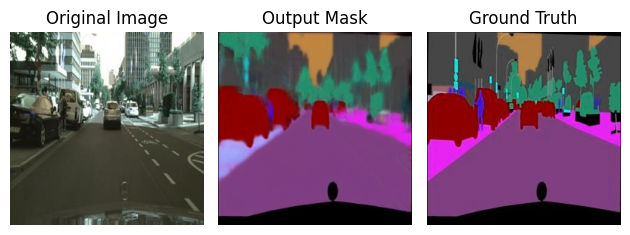

93/93 [==============================] - 21s 222ms/step - loss: 0.5384 - accuracy: 0.6617 - mean_io_u_1: 0.4998 - val_loss: 0.5518 - val_accuracy: 0.7542 - val_mean_io_u_1: 0.4999
Epoch 22/100
1/1 [==============================] - 0s 21ms/step


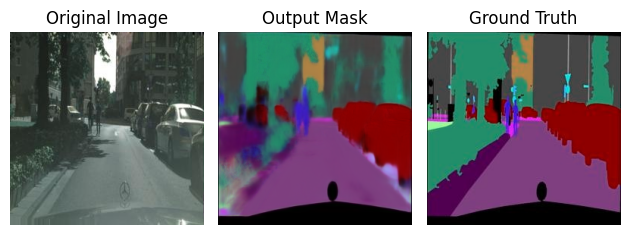

93/93 [==============================] - 21s 221ms/step - loss: 0.5377 - accuracy: 0.6660 - mean_io_u_1: 0.4998 - val_loss: 0.5515 - val_accuracy: 0.7302 - val_mean_io_u_1: 0.4999
Epoch 23/100
1/1 [==============================] - 0s 22ms/step


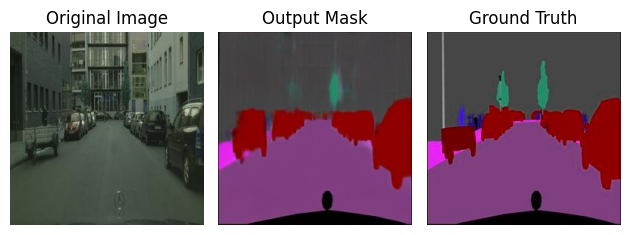

93/93 [==============================] - 21s 224ms/step - loss: 0.5370 - accuracy: 0.6662 - mean_io_u_1: 0.4998 - val_loss: 0.5529 - val_accuracy: 0.7277 - val_mean_io_u_1: 0.4999
Epoch 24/100
1/1 [==============================] - 0s 23ms/step


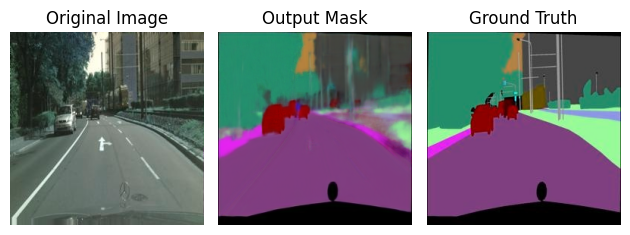

93/93 [==============================] - 21s 221ms/step - loss: 0.5366 - accuracy: 0.6671 - mean_io_u_1: 0.4998 - val_loss: 0.5536 - val_accuracy: 0.5856 - val_mean_io_u_1: 0.4999
Epoch 25/100
1/1 [==============================] - 0s 23ms/step


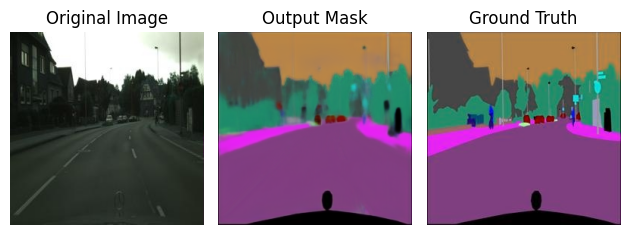

93/93 [==============================] - 21s 221ms/step - loss: 0.5359 - accuracy: 0.6694 - mean_io_u_1: 0.4998 - val_loss: 0.5519 - val_accuracy: 0.5401 - val_mean_io_u_1: 0.4999
Epoch 26/100
1/1 [==============================] - 0s 22ms/step


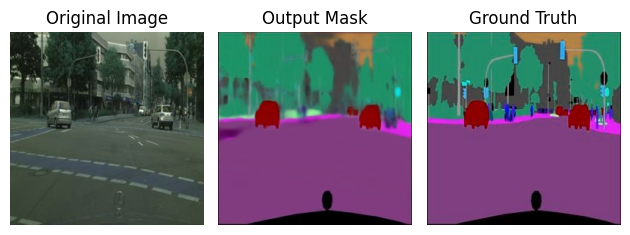

93/93 [==============================] - 21s 221ms/step - loss: 0.5357 - accuracy: 0.6678 - mean_io_u_1: 0.4998 - val_loss: 0.5532 - val_accuracy: 0.5617 - val_mean_io_u_1: 0.4999
Epoch 27/100
1/1 [==============================] - 0s 23ms/step


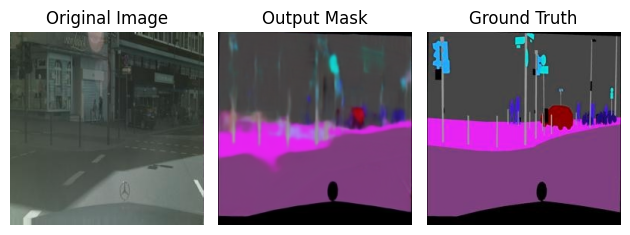

93/93 [==============================] - 21s 221ms/step - loss: 0.5350 - accuracy: 0.6781 - mean_io_u_1: 0.4998 - val_loss: 0.5516 - val_accuracy: 0.5516 - val_mean_io_u_1: 0.4999
Epoch 28/100
1/1 [==============================] - 0s 22ms/step


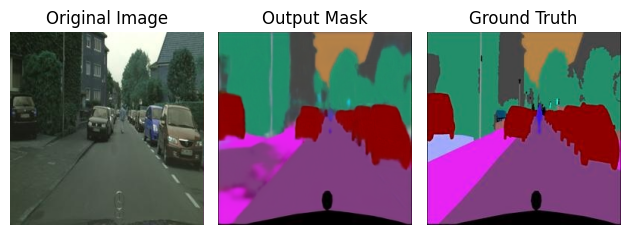

93/93 [==============================] - 21s 221ms/step - loss: 0.5345 - accuracy: 0.6623 - mean_io_u_1: 0.4998 - val_loss: 0.5516 - val_accuracy: 0.6764 - val_mean_io_u_1: 0.4999
Epoch 29/100
1/1 [==============================] - 0s 22ms/step


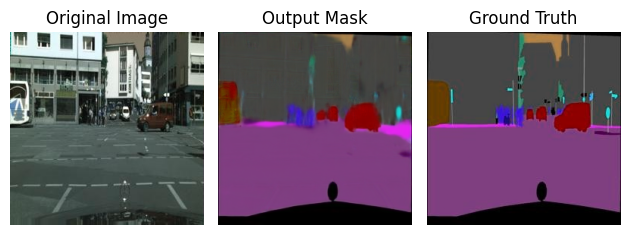

93/93 [==============================] - 21s 222ms/step - loss: 0.5340 - accuracy: 0.6777 - mean_io_u_1: 0.4998 - val_loss: 0.5525 - val_accuracy: 0.7399 - val_mean_io_u_1: 0.4999
Epoch 30/100
1/1 [==============================] - 0s 22ms/step


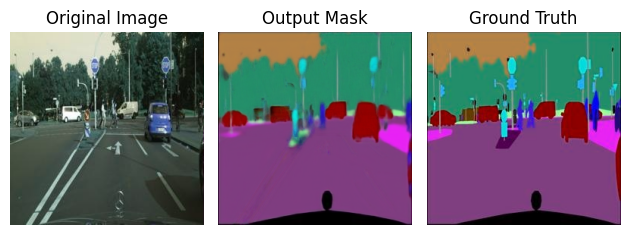

93/93 [==============================] - 21s 221ms/step - loss: 0.5335 - accuracy: 0.6694 - mean_io_u_1: 0.4998 - val_loss: 0.5517 - val_accuracy: 0.7262 - val_mean_io_u_1: 0.4999
Epoch 31/100
1/1 [==============================] - 0s 21ms/step


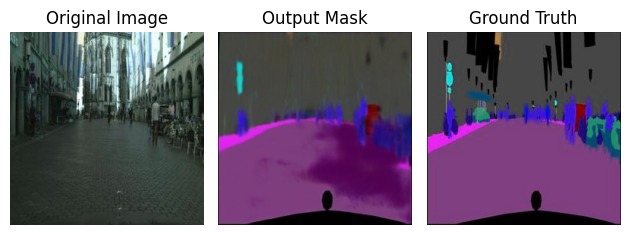

93/93 [==============================] - 21s 221ms/step - loss: 0.5331 - accuracy: 0.6838 - mean_io_u_1: 0.4998 - val_loss: 0.5542 - val_accuracy: 0.5921 - val_mean_io_u_1: 0.4999
Epoch 32/100
1/1 [==============================] - 0s 22ms/step


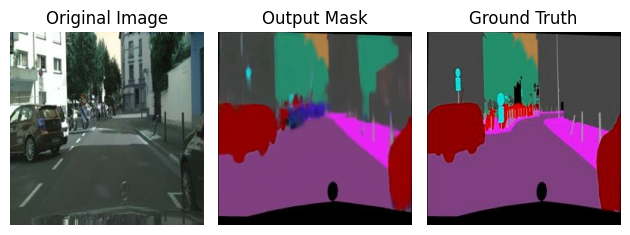

93/93 [==============================] - 21s 221ms/step - loss: 0.5330 - accuracy: 0.6734 - mean_io_u_1: 0.4998 - val_loss: 0.5514 - val_accuracy: 0.6276 - val_mean_io_u_1: 0.4999
Epoch 33/100
1/1 [==============================] - 0s 22ms/step


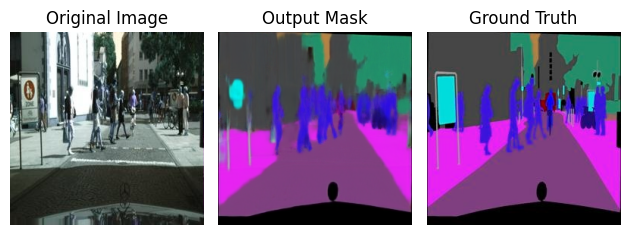

93/93 [==============================] - 21s 221ms/step - loss: 0.5325 - accuracy: 0.6872 - mean_io_u_1: 0.4998 - val_loss: 0.5523 - val_accuracy: 0.6982 - val_mean_io_u_1: 0.4999
Epoch 34/100
1/1 [==============================] - 0s 21ms/step


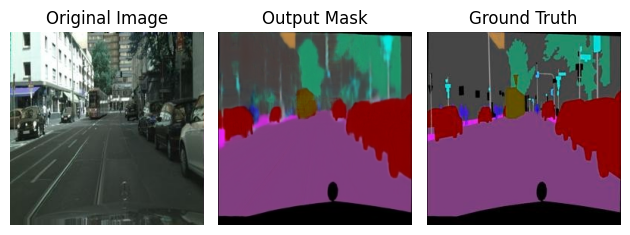

93/93 [==============================] - 21s 221ms/step - loss: 0.5323 - accuracy: 0.6808 - mean_io_u_1: 0.4998 - val_loss: 0.5540 - val_accuracy: 0.5676 - val_mean_io_u_1: 0.4999
Epoch 35/100
1/1 [==============================] - 0s 22ms/step


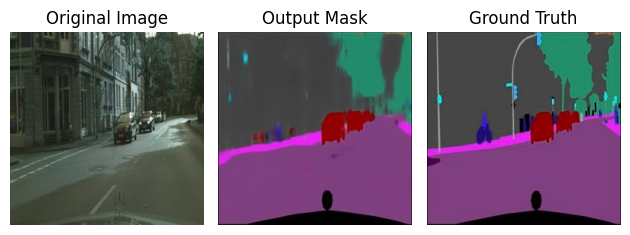

93/93 [==============================] - 21s 221ms/step - loss: 0.5321 - accuracy: 0.6889 - mean_io_u_1: 0.4998 - val_loss: 0.5518 - val_accuracy: 0.7124 - val_mean_io_u_1: 0.4999
Epoch 36/100
1/1 [==============================] - 0s 22ms/step


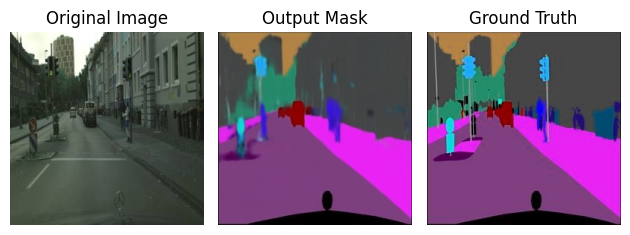

93/93 [==============================] - 21s 221ms/step - loss: 0.5316 - accuracy: 0.6953 - mean_io_u_1: 0.4998 - val_loss: 0.5524 - val_accuracy: 0.7155 - val_mean_io_u_1: 0.4999
Epoch 37/100
1/1 [==============================] - 0s 21ms/step


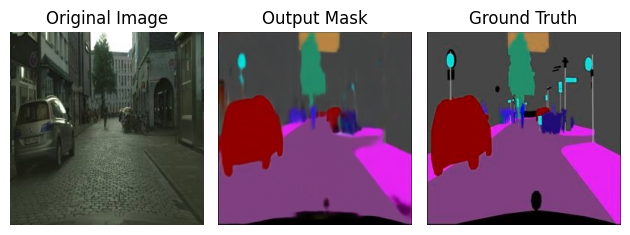

93/93 [==============================] - 21s 221ms/step - loss: 0.5316 - accuracy: 0.6861 - mean_io_u_1: 0.4998 - val_loss: 0.5528 - val_accuracy: 0.7137 - val_mean_io_u_1: 0.4999
Epoch 38/100
1/1 [==============================] - 0s 23ms/step


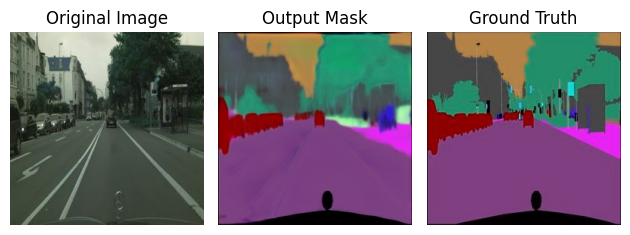

93/93 [==============================] - 21s 221ms/step - loss: 0.5350 - accuracy: 0.6783 - mean_io_u_1: 0.4998 - val_loss: 0.5678 - val_accuracy: 0.6793 - val_mean_io_u_1: 0.4999
Epoch 39/100
1/1 [==============================] - 0s 23ms/step


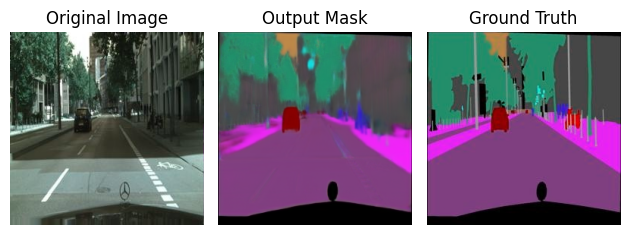

93/93 [==============================] - 21s 222ms/step - loss: 0.5435 - accuracy: 0.6709 - mean_io_u_1: 0.4998 - val_loss: 0.5666 - val_accuracy: 0.5709 - val_mean_io_u_1: 0.4999
Epoch 40/100
1/1 [==============================] - 0s 22ms/step


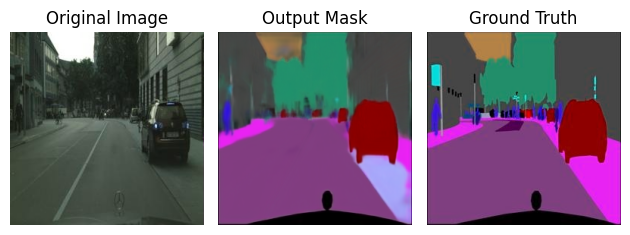

93/93 [==============================] - 21s 222ms/step - loss: 0.5378 - accuracy: 0.6678 - mean_io_u_1: 0.4998 - val_loss: 0.5535 - val_accuracy: 0.5574 - val_mean_io_u_1: 0.4999
Epoch 41/100
1/1 [==============================] - 0s 23ms/step


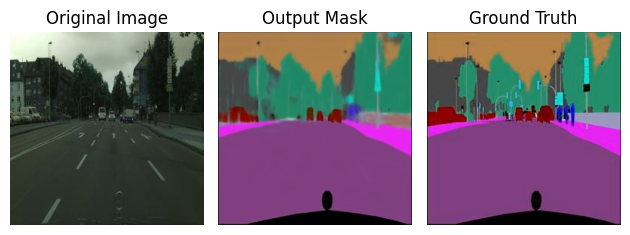

93/93 [==============================] - 21s 221ms/step - loss: 0.5343 - accuracy: 0.6795 - mean_io_u_1: 0.4998 - val_loss: 0.5529 - val_accuracy: 0.5524 - val_mean_io_u_1: 0.4999
Epoch 42/100
1/1 [==============================] - 0s 22ms/step


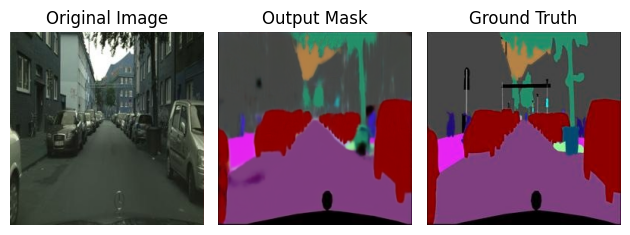

93/93 [==============================] - 21s 221ms/step - loss: 0.5326 - accuracy: 0.6799 - mean_io_u_1: 0.4998 - val_loss: 0.5520 - val_accuracy: 0.6910 - val_mean_io_u_1: 0.4999
Epoch 43/100
1/1 [==============================] - 0s 24ms/step


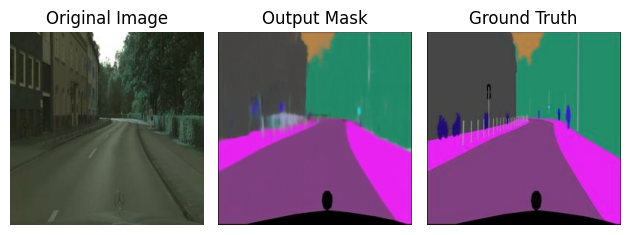

93/93 [==============================] - 21s 225ms/step - loss: 0.5318 - accuracy: 0.6844 - mean_io_u_1: 0.4998 - val_loss: 0.5515 - val_accuracy: 0.7669 - val_mean_io_u_1: 0.4999
Epoch 44/100
1/1 [==============================] - 0s 23ms/step


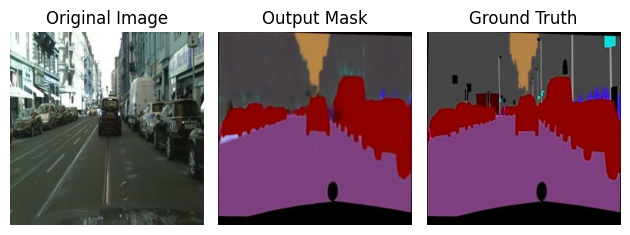

93/93 [==============================] - 21s 221ms/step - loss: 0.5313 - accuracy: 0.6831 - mean_io_u_1: 0.4998 - val_loss: 0.5516 - val_accuracy: 0.7705 - val_mean_io_u_1: 0.4999
Epoch 45/100
1/1 [==============================] - 0s 23ms/step


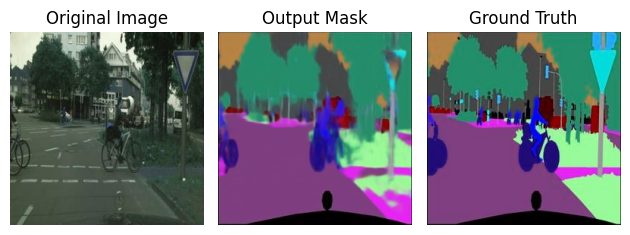

93/93 [==============================] - 21s 222ms/step - loss: 0.5309 - accuracy: 0.6826 - mean_io_u_1: 0.4998 - val_loss: 0.5516 - val_accuracy: 0.7049 - val_mean_io_u_1: 0.4999
Epoch 46/100
1/1 [==============================] - 0s 23ms/step


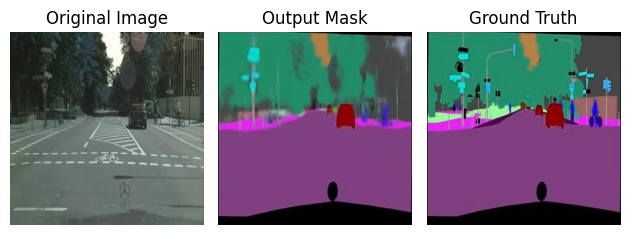

93/93 [==============================] - 21s 221ms/step - loss: 0.5307 - accuracy: 0.6838 - mean_io_u_1: 0.4998 - val_loss: 0.5515 - val_accuracy: 0.7135 - val_mean_io_u_1: 0.4999
Epoch 47/100
1/1 [==============================] - 0s 22ms/step


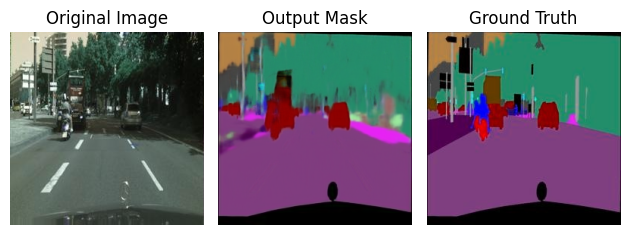

93/93 [==============================] - 21s 221ms/step - loss: 0.5305 - accuracy: 0.7000 - mean_io_u_1: 0.4998 - val_loss: 0.5524 - val_accuracy: 0.5169 - val_mean_io_u_1: 0.4999
Epoch 48/100
1/1 [==============================] - 0s 22ms/step


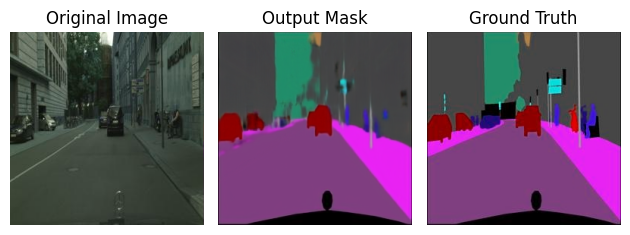

93/93 [==============================] - 21s 222ms/step - loss: 0.5303 - accuracy: 0.6865 - mean_io_u_1: 0.4998 - val_loss: 0.5516 - val_accuracy: 0.7080 - val_mean_io_u_1: 0.4999
Epoch 49/100
1/1 [==============================] - 0s 22ms/step


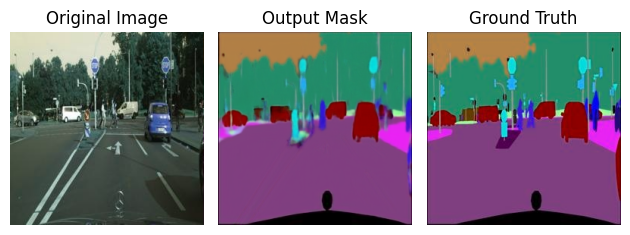

93/93 [==============================] - 21s 221ms/step - loss: 0.5301 - accuracy: 0.6890 - mean_io_u_1: 0.4998 - val_loss: 0.5524 - val_accuracy: 0.6609 - val_mean_io_u_1: 0.4999
Epoch 50/100
1/1 [==============================] - 0s 23ms/step


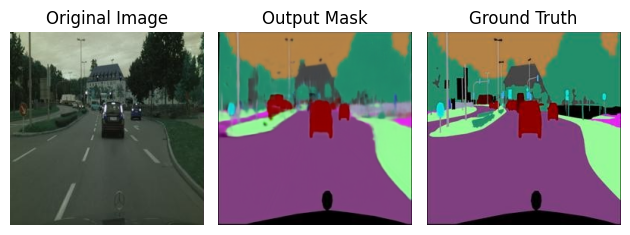

93/93 [==============================] - 21s 221ms/step - loss: 0.5299 - accuracy: 0.7049 - mean_io_u_1: 0.4998 - val_loss: 0.5528 - val_accuracy: 0.5491 - val_mean_io_u_1: 0.4999
Epoch 51/100
1/1 [==============================] - 0s 23ms/step


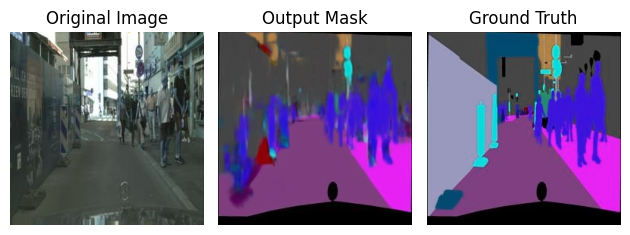

93/93 [==============================] - 21s 221ms/step - loss: 0.5298 - accuracy: 0.6980 - mean_io_u_1: 0.4998 - val_loss: 0.5524 - val_accuracy: 0.6064 - val_mean_io_u_1: 0.4999
Epoch 52/100
1/1 [==============================] - 0s 22ms/step


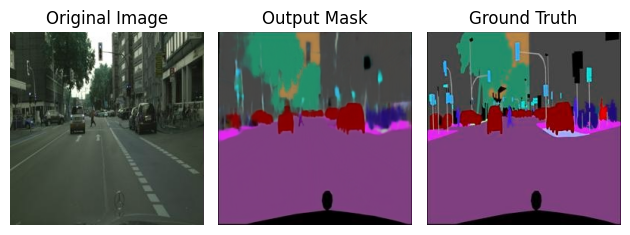

93/93 [==============================] - 21s 221ms/step - loss: 0.5298 - accuracy: 0.6979 - mean_io_u_1: 0.4998 - val_loss: 0.5519 - val_accuracy: 0.7655 - val_mean_io_u_1: 0.4999
Epoch 53/100
1/1 [==============================] - 0s 21ms/step


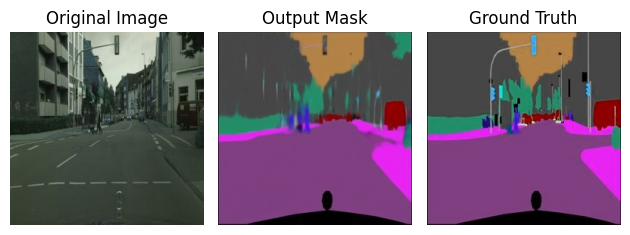

93/93 [==============================] - 21s 221ms/step - loss: 0.5297 - accuracy: 0.6972 - mean_io_u_1: 0.4998 - val_loss: 0.5518 - val_accuracy: 0.7581 - val_mean_io_u_1: 0.4999
Epoch 54/100
1/1 [==============================] - 0s 23ms/step


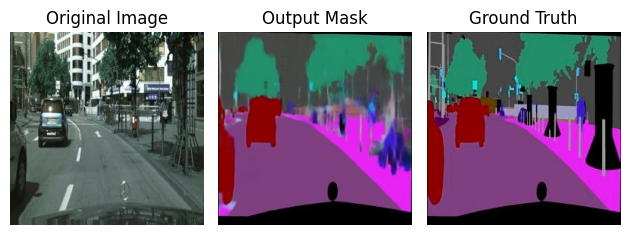

93/93 [==============================] - 21s 221ms/step - loss: 0.5296 - accuracy: 0.6972 - mean_io_u_1: 0.4998 - val_loss: 0.5530 - val_accuracy: 0.7063 - val_mean_io_u_1: 0.4999
Epoch 55/100
1/1 [==============================] - 0s 22ms/step


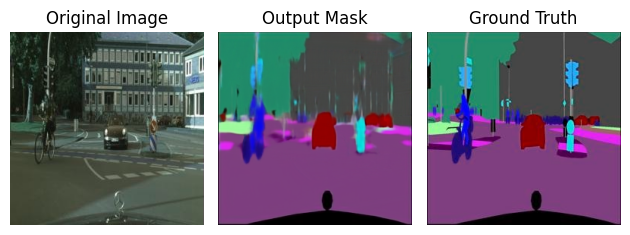

93/93 [==============================] - 21s 221ms/step - loss: 0.5294 - accuracy: 0.7018 - mean_io_u_1: 0.4998 - val_loss: 0.5535 - val_accuracy: 0.7411 - val_mean_io_u_1: 0.4999
Epoch 56/100
1/1 [==============================] - 0s 21ms/step


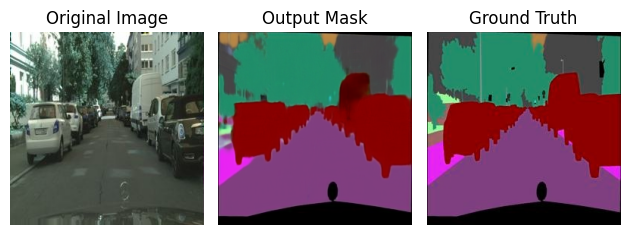

93/93 [==============================] - 21s 222ms/step - loss: 0.5294 - accuracy: 0.6998 - mean_io_u_1: 0.4998 - val_loss: 0.5527 - val_accuracy: 0.5953 - val_mean_io_u_1: 0.4999
Epoch 57/100
1/1 [==============================] - 0s 22ms/step


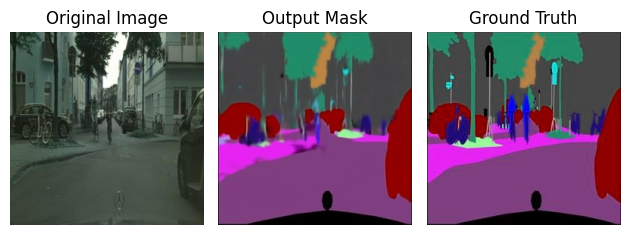

93/93 [==============================] - 21s 221ms/step - loss: 0.5294 - accuracy: 0.7031 - mean_io_u_1: 0.4998 - val_loss: 0.5529 - val_accuracy: 0.6914 - val_mean_io_u_1: 0.4999
Epoch 58/100
1/1 [==============================] - 0s 22ms/step


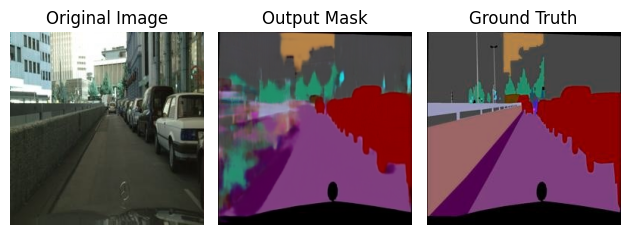

93/93 [==============================] - 21s 221ms/step - loss: 0.5293 - accuracy: 0.6980 - mean_io_u_1: 0.4998 - val_loss: 0.5529 - val_accuracy: 0.6856 - val_mean_io_u_1: 0.4999
Epoch 59/100
1/1 [==============================] - 0s 21ms/step


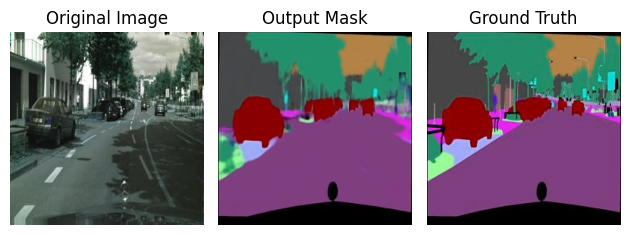

93/93 [==============================] - 21s 222ms/step - loss: 0.5292 - accuracy: 0.6889 - mean_io_u_1: 0.4998 - val_loss: 0.5532 - val_accuracy: 0.5848 - val_mean_io_u_1: 0.4999
Epoch 60/100
1/1 [==============================] - 0s 21ms/step


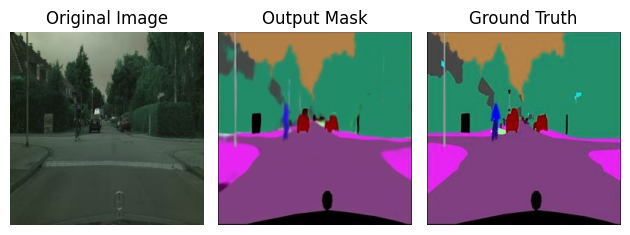

93/93 [==============================] - 21s 221ms/step - loss: 0.5291 - accuracy: 0.7122 - mean_io_u_1: 0.4998 - val_loss: 0.5525 - val_accuracy: 0.6297 - val_mean_io_u_1: 0.4999
Epoch 61/100
1/1 [==============================] - 0s 22ms/step


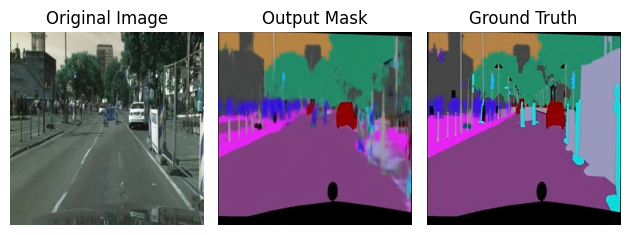

93/93 [==============================] - 21s 222ms/step - loss: 0.5290 - accuracy: 0.7102 - mean_io_u_1: 0.4998 - val_loss: 0.5526 - val_accuracy: 0.6769 - val_mean_io_u_1: 0.4999
Epoch 62/100
1/1 [==============================] - 0s 21ms/step


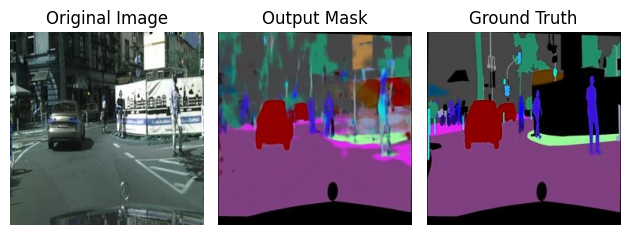

93/93 [==============================] - 21s 224ms/step - loss: 0.5289 - accuracy: 0.7077 - mean_io_u_1: 0.4998 - val_loss: 0.5533 - val_accuracy: 0.7255 - val_mean_io_u_1: 0.4999
Epoch 63/100
1/1 [==============================] - 0s 25ms/step


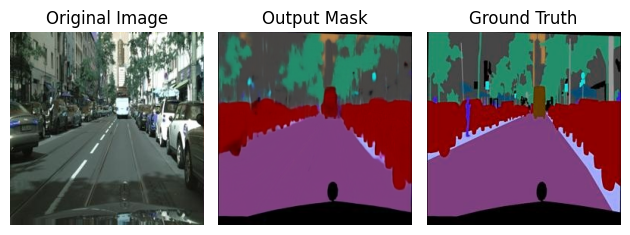

93/93 [==============================] - 21s 222ms/step - loss: 0.5289 - accuracy: 0.7000 - mean_io_u_1: 0.4998 - val_loss: 0.5523 - val_accuracy: 0.7801 - val_mean_io_u_1: 0.4999
Epoch 64/100
1/1 [==============================] - 0s 24ms/step


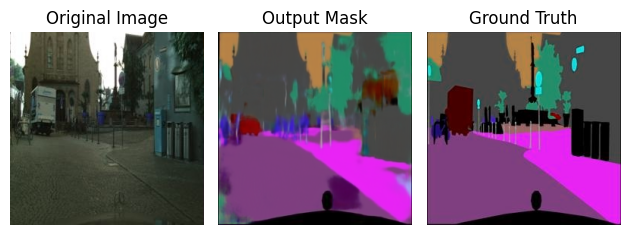

93/93 [==============================] - 21s 221ms/step - loss: 0.5297 - accuracy: 0.7040 - mean_io_u_1: 0.4998 - val_loss: 0.5562 - val_accuracy: 0.7665 - val_mean_io_u_1: 0.4999
Epoch 65/100
1/1 [==============================] - 0s 23ms/step


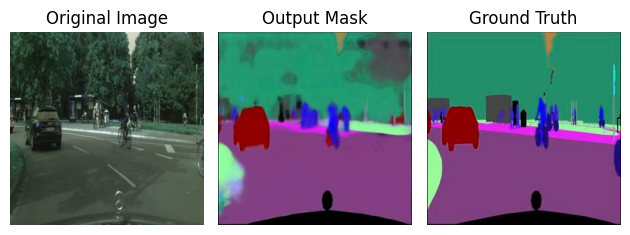

93/93 [==============================] - 21s 221ms/step - loss: 0.5376 - accuracy: 0.6755 - mean_io_u_1: 0.4998 - val_loss: 0.5689 - val_accuracy: 0.5322 - val_mean_io_u_1: 0.4999
Epoch 66/100
1/1 [==============================] - 0s 23ms/step


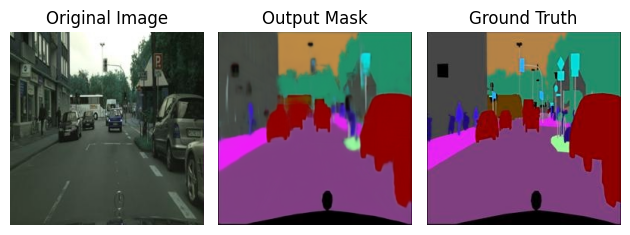

93/93 [==============================] - 21s 222ms/step - loss: 0.5382 - accuracy: 0.6896 - mean_io_u_1: 0.4998 - val_loss: 0.5591 - val_accuracy: 0.7035 - val_mean_io_u_1: 0.4999
Epoch 67/100
1/1 [==============================] - 0s 23ms/step


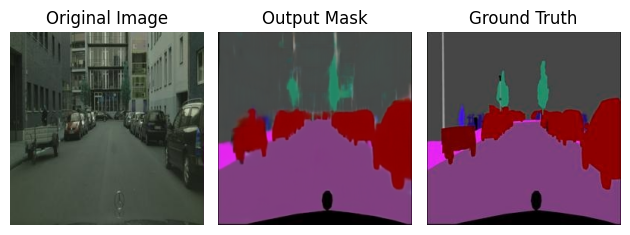

93/93 [==============================] - 21s 221ms/step - loss: 0.5332 - accuracy: 0.7021 - mean_io_u_1: 0.4998 - val_loss: 0.5520 - val_accuracy: 0.5964 - val_mean_io_u_1: 0.4999
Epoch 68/100
1/1 [==============================] - 0s 23ms/step


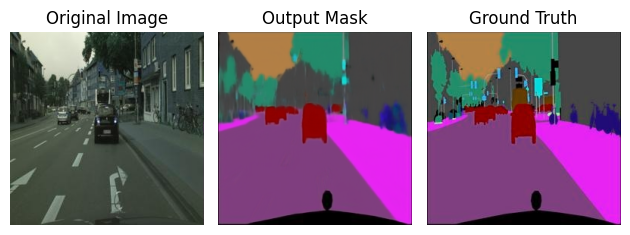

93/93 [==============================] - 21s 221ms/step - loss: 0.5312 - accuracy: 0.7118 - mean_io_u_1: 0.4998 - val_loss: 0.5514 - val_accuracy: 0.5791 - val_mean_io_u_1: 0.4999
Epoch 69/100
1/1 [==============================] - 0s 23ms/step


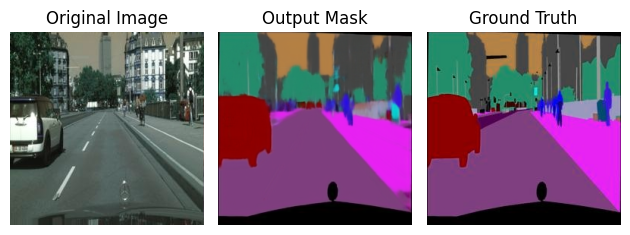

93/93 [==============================] - 21s 221ms/step - loss: 0.5301 - accuracy: 0.7008 - mean_io_u_1: 0.4998 - val_loss: 0.5515 - val_accuracy: 0.5663 - val_mean_io_u_1: 0.4999
Epoch 70/100
1/1 [==============================] - 0s 24ms/step


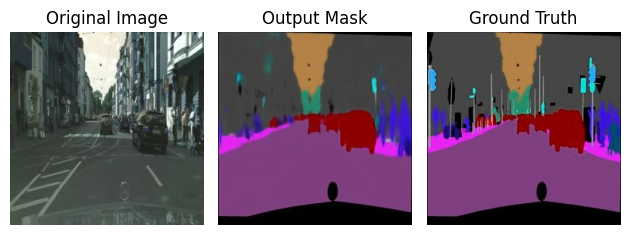

93/93 [==============================] - 21s 222ms/step - loss: 0.5297 - accuracy: 0.6927 - mean_io_u_1: 0.4998 - val_loss: 0.5513 - val_accuracy: 0.7402 - val_mean_io_u_1: 0.4999
Epoch 71/100
1/1 [==============================] - 0s 22ms/step


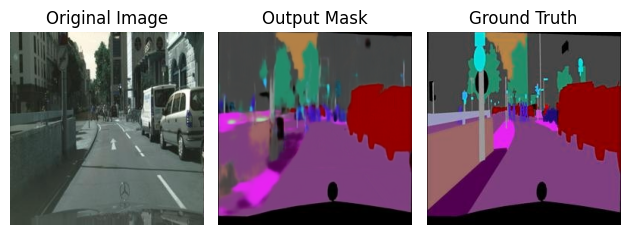

93/93 [==============================] - 21s 222ms/step - loss: 0.5292 - accuracy: 0.7025 - mean_io_u_1: 0.4998 - val_loss: 0.5517 - val_accuracy: 0.7116 - val_mean_io_u_1: 0.4999
Epoch 72/100
1/1 [==============================] - 0s 21ms/step


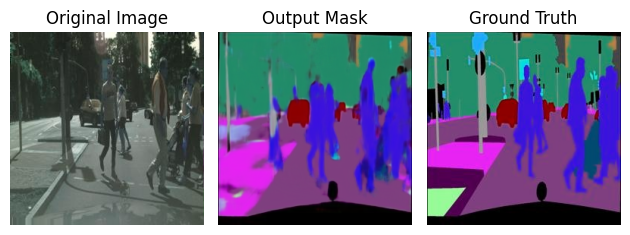

93/93 [==============================] - 21s 222ms/step - loss: 0.5290 - accuracy: 0.7088 - mean_io_u_1: 0.4998 - val_loss: 0.5523 - val_accuracy: 0.7047 - val_mean_io_u_1: 0.4999
Epoch 73/100
1/1 [==============================] - 0s 22ms/step


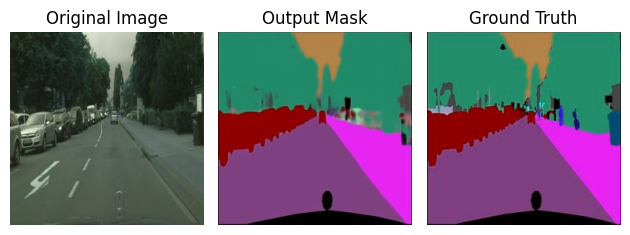

93/93 [==============================] - 21s 222ms/step - loss: 0.5289 - accuracy: 0.7021 - mean_io_u_1: 0.4998 - val_loss: 0.5518 - val_accuracy: 0.7051 - val_mean_io_u_1: 0.4999
Epoch 74/100
1/1 [==============================] - 0s 22ms/step


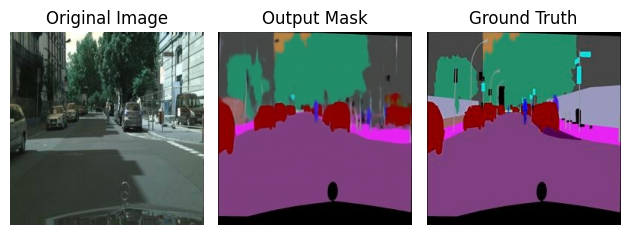

93/93 [==============================] - 21s 221ms/step - loss: 0.5287 - accuracy: 0.7160 - mean_io_u_1: 0.4998 - val_loss: 0.5520 - val_accuracy: 0.6951 - val_mean_io_u_1: 0.4999
Epoch 75/100
1/1 [==============================] - 0s 23ms/step


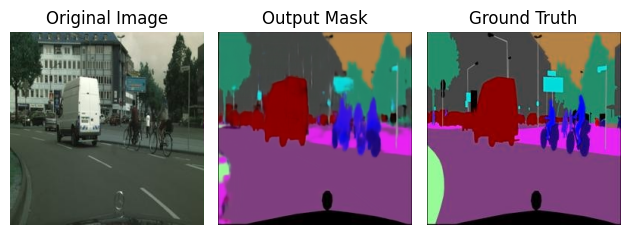

93/93 [==============================] - 21s 222ms/step - loss: 0.5286 - accuracy: 0.6979 - mean_io_u_1: 0.4998 - val_loss: 0.5527 - val_accuracy: 0.7153 - val_mean_io_u_1: 0.4999
Epoch 76/100
1/1 [==============================] - 0s 22ms/step


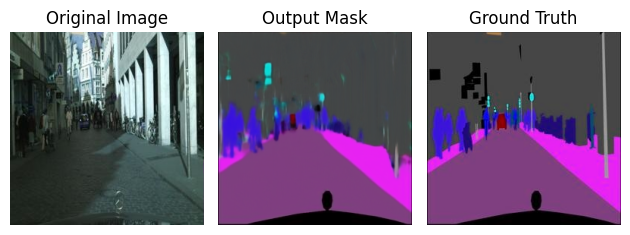

93/93 [==============================] - 21s 221ms/step - loss: 0.5285 - accuracy: 0.7023 - mean_io_u_1: 0.4998 - val_loss: 0.5522 - val_accuracy: 0.7242 - val_mean_io_u_1: 0.4999
Epoch 77/100
1/1 [==============================] - 0s 21ms/step


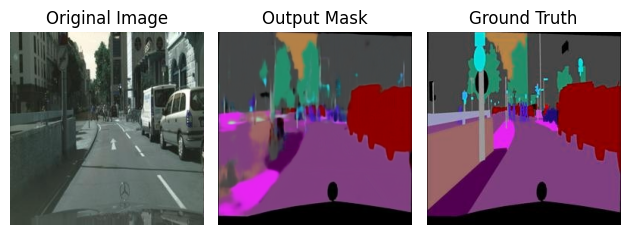

93/93 [==============================] - 21s 221ms/step - loss: 0.5285 - accuracy: 0.7109 - mean_io_u_1: 0.4998 - val_loss: 0.5522 - val_accuracy: 0.5735 - val_mean_io_u_1: 0.4999
Epoch 78/100
1/1 [==============================] - 0s 22ms/step


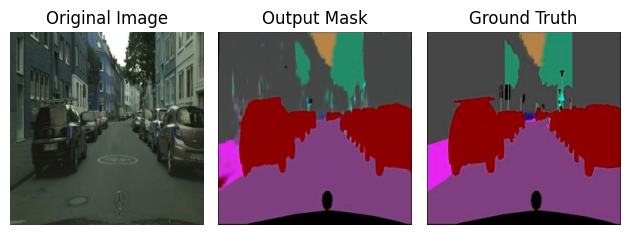

93/93 [==============================] - 21s 221ms/step - loss: 0.5283 - accuracy: 0.7183 - mean_io_u_1: 0.4998 - val_loss: 0.5524 - val_accuracy: 0.7061 - val_mean_io_u_1: 0.4999
Epoch 79/100
1/1 [==============================] - 0s 21ms/step


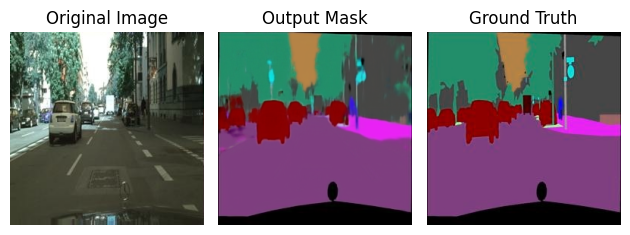

93/93 [==============================] - 21s 222ms/step - loss: 0.5283 - accuracy: 0.7243 - mean_io_u_1: 0.4998 - val_loss: 0.5527 - val_accuracy: 0.7477 - val_mean_io_u_1: 0.4999
Epoch 80/100
1/1 [==============================] - 0s 22ms/step


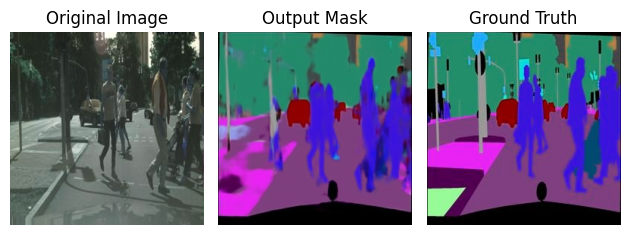

93/93 [==============================] - 21s 222ms/step - loss: 0.5283 - accuracy: 0.7119 - mean_io_u_1: 0.4998 - val_loss: 0.5526 - val_accuracy: 0.5318 - val_mean_io_u_1: 0.4999
Epoch 81/100
1/1 [==============================] - 0s 21ms/step


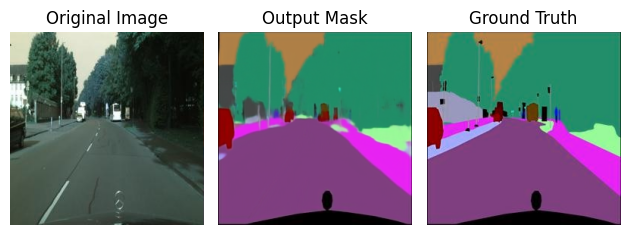

93/93 [==============================] - 21s 221ms/step - loss: 0.5283 - accuracy: 0.7194 - mean_io_u_1: 0.4998 - val_loss: 0.5524 - val_accuracy: 0.7235 - val_mean_io_u_1: 0.4999
Epoch 82/100
1/1 [==============================] - 0s 21ms/step


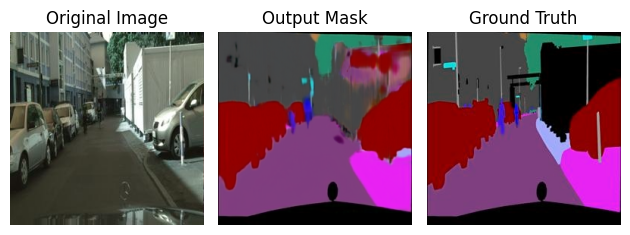

93/93 [==============================] - 21s 225ms/step - loss: 0.5282 - accuracy: 0.7212 - mean_io_u_1: 0.4998 - val_loss: 0.5524 - val_accuracy: 0.5155 - val_mean_io_u_1: 0.4999
Epoch 83/100
1/1 [==============================] - 0s 24ms/step


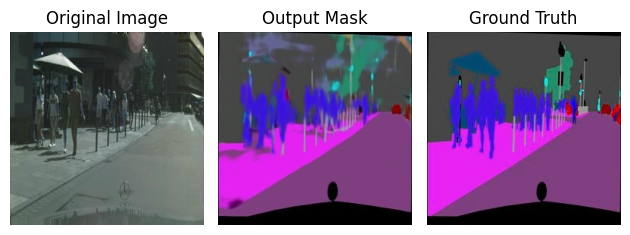

93/93 [==============================] - 21s 221ms/step - loss: 0.5282 - accuracy: 0.7219 - mean_io_u_1: 0.4998 - val_loss: 0.5526 - val_accuracy: 0.7179 - val_mean_io_u_1: 0.4999
Epoch 84/100
1/1 [==============================] - 0s 24ms/step


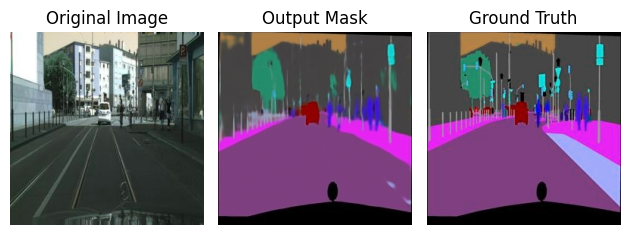

93/93 [==============================] - 21s 221ms/step - loss: 0.5282 - accuracy: 0.7253 - mean_io_u_1: 0.4998 - val_loss: 0.5526 - val_accuracy: 0.8020 - val_mean_io_u_1: 0.4999
Epoch 85/100
1/1 [==============================] - 0s 24ms/step


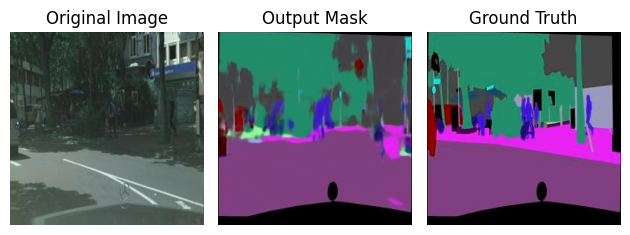

93/93 [==============================] - 21s 222ms/step - loss: 0.5281 - accuracy: 0.7132 - mean_io_u_1: 0.4998 - val_loss: 0.5525 - val_accuracy: 0.7372 - val_mean_io_u_1: 0.4999
Epoch 86/100
1/1 [==============================] - 0s 24ms/step


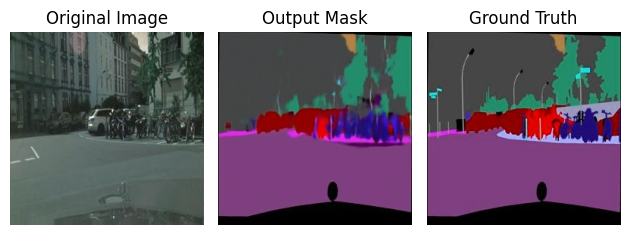

93/93 [==============================] - 21s 221ms/step - loss: 0.5281 - accuracy: 0.7213 - mean_io_u_1: 0.4998 - val_loss: 0.5527 - val_accuracy: 0.7047 - val_mean_io_u_1: 0.4999
Epoch 87/100
1/1 [==============================] - 0s 24ms/step


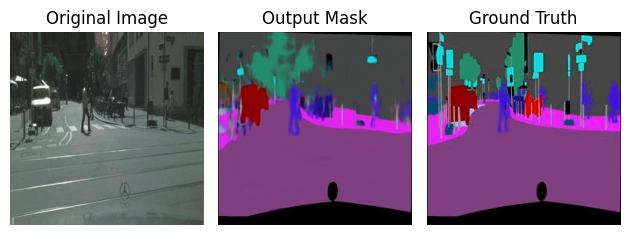

93/93 [==============================] - 21s 222ms/step - loss: 0.5280 - accuracy: 0.7133 - mean_io_u_1: 0.4998 - val_loss: 0.5528 - val_accuracy: 0.6987 - val_mean_io_u_1: 0.4999
Epoch 88/100
1/1 [==============================] - 0s 22ms/step


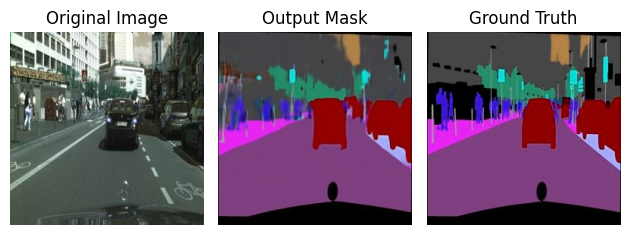

93/93 [==============================] - 21s 221ms/step - loss: 0.5280 - accuracy: 0.7173 - mean_io_u_1: 0.4998 - val_loss: 0.5526 - val_accuracy: 0.7180 - val_mean_io_u_1: 0.4999
Epoch 89/100
1/1 [==============================] - 0s 22ms/step


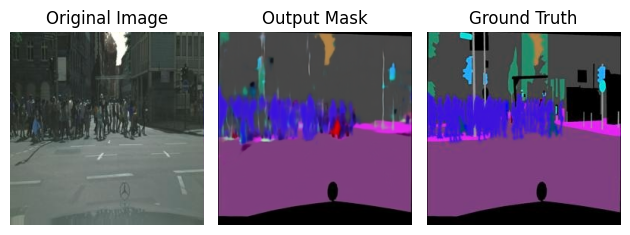

93/93 [==============================] - 21s 221ms/step - loss: 0.5280 - accuracy: 0.7187 - mean_io_u_1: 0.4998 - val_loss: 0.5527 - val_accuracy: 0.6911 - val_mean_io_u_1: 0.4999
Epoch 90/100
1/1 [==============================] - 0s 22ms/step


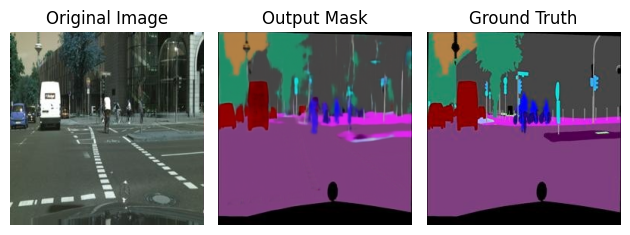

93/93 [==============================] - 21s 222ms/step - loss: 0.5280 - accuracy: 0.7227 - mean_io_u_1: 0.4998 - val_loss: 0.5528 - val_accuracy: 0.6015 - val_mean_io_u_1: 0.4999
Epoch 91/100
1/1 [==============================] - 0s 22ms/step


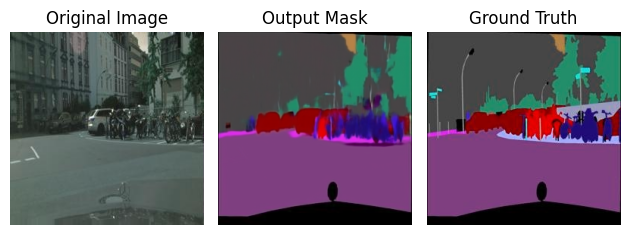

93/93 [==============================] - 21s 221ms/step - loss: 0.5279 - accuracy: 0.7021 - mean_io_u_1: 0.4998 - val_loss: 0.5526 - val_accuracy: 0.7979 - val_mean_io_u_1: 0.4999
Epoch 92/100
1/1 [==============================] - 0s 22ms/step


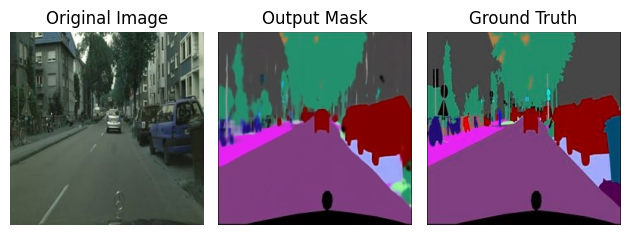

93/93 [==============================] - 21s 221ms/step - loss: 0.5279 - accuracy: 0.7242 - mean_io_u_1: 0.4998 - val_loss: 0.5534 - val_accuracy: 0.6877 - val_mean_io_u_1: 0.4999
Epoch 93/100
1/1 [==============================] - 0s 22ms/step


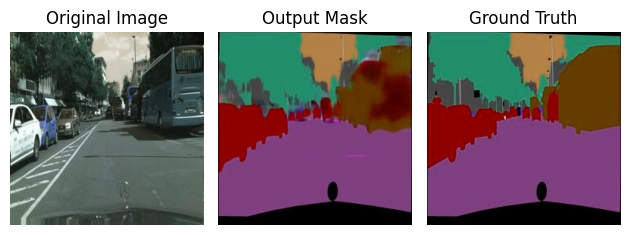

93/93 [==============================] - 21s 221ms/step - loss: 0.5279 - accuracy: 0.7188 - mean_io_u_1: 0.4998 - val_loss: 0.5528 - val_accuracy: 0.7754 - val_mean_io_u_1: 0.4999
Epoch 94/100
1/1 [==============================] - 0s 23ms/step


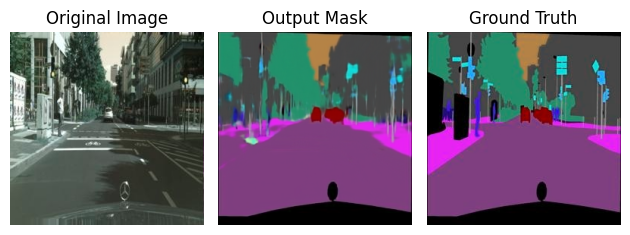

93/93 [==============================] - 21s 221ms/step - loss: 0.5279 - accuracy: 0.7211 - mean_io_u_1: 0.4998 - val_loss: 0.5529 - val_accuracy: 0.7033 - val_mean_io_u_1: 0.4999
Epoch 95/100
1/1 [==============================] - 0s 22ms/step


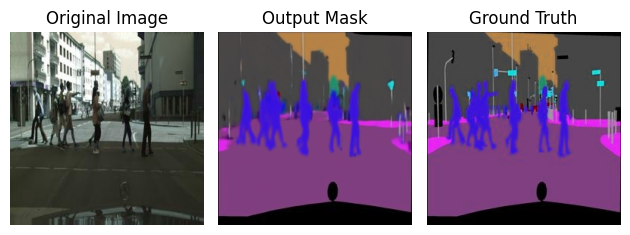

93/93 [==============================] - 21s 221ms/step - loss: 0.5280 - accuracy: 0.7211 - mean_io_u_1: 0.4998 - val_loss: 0.5535 - val_accuracy: 0.6799 - val_mean_io_u_1: 0.4999
Epoch 96/100
1/1 [==============================] - 0s 21ms/step


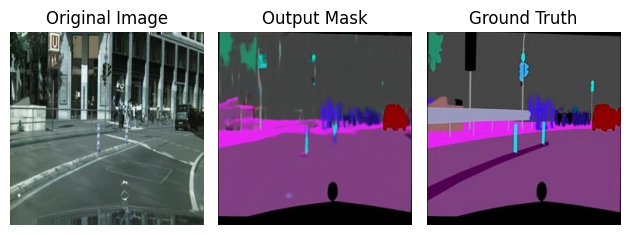

93/93 [==============================] - 21s 221ms/step - loss: 0.5280 - accuracy: 0.7121 - mean_io_u_1: 0.4998 - val_loss: 0.5534 - val_accuracy: 0.7166 - val_mean_io_u_1: 0.4999
Epoch 97/100
1/1 [==============================] - 0s 23ms/step


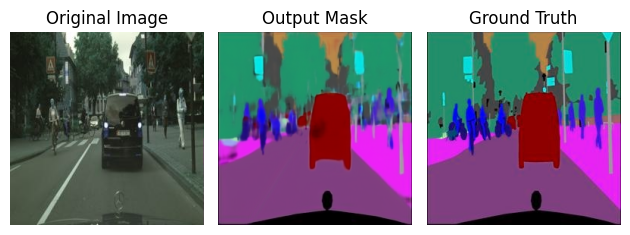

93/93 [==============================] - 21s 221ms/step - loss: 0.5296 - accuracy: 0.7210 - mean_io_u_1: 0.4998 - val_loss: 0.5585 - val_accuracy: 0.6989 - val_mean_io_u_1: 0.4999
Epoch 98/100
1/1 [==============================] - 0s 21ms/step


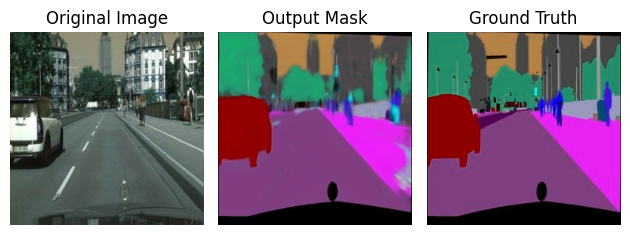

93/93 [==============================] - 21s 221ms/step - loss: 0.5356 - accuracy: 0.6964 - mean_io_u_1: 0.4998 - val_loss: 0.5581 - val_accuracy: 0.6395 - val_mean_io_u_1: 0.4999
Epoch 99/100
1/1 [==============================] - 0s 21ms/step


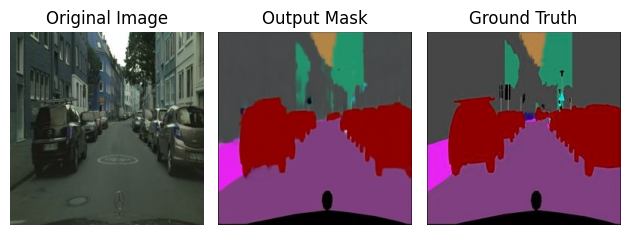

93/93 [==============================] - 21s 221ms/step - loss: 0.5329 - accuracy: 0.7042 - mean_io_u_1: 0.4998 - val_loss: 0.5541 - val_accuracy: 0.7079 - val_mean_io_u_1: 0.4999
Epoch 100/100
1/1 [==============================] - 0s 22ms/step


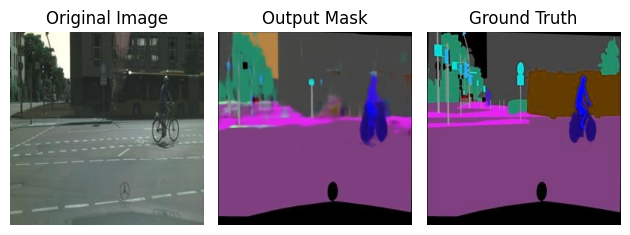

93/93 [==============================] - 21s 221ms/step - loss: 0.5302 - accuracy: 0.7158 - mean_io_u_1: 0.4998 - val_loss: 0.5525 - val_accuracy: 0.7352 - val_mean_io_u_1: 0.4999


In [ ]:
history = model.fit(
              X_train, Y_train,
              epochs= 100,
              verbose=1,
              validation_data=(X_valid, Y_valid),
              callbacks=[show_progress, early_stop])

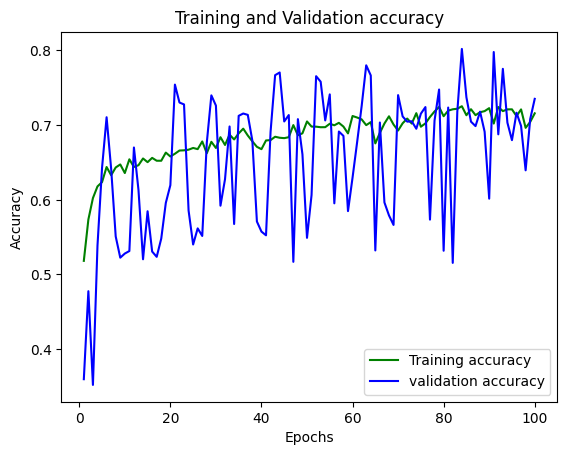

In [ ]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

epochs = range(1,history.epoch[-1]+2)
plt.plot(epochs, train_accuracy, 'g', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'b', label='validation accuracy')
plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

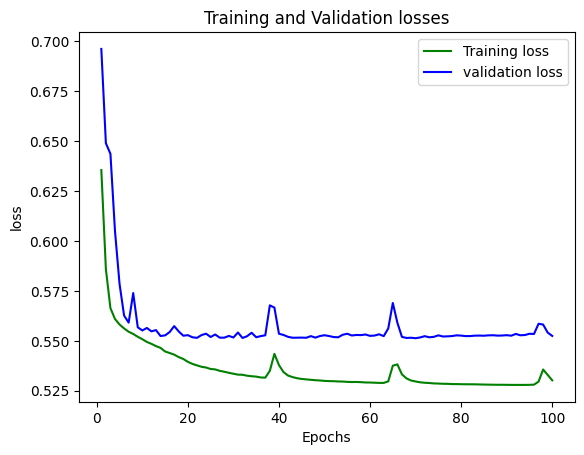

In [ ]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(epochs, train_loss, 'g', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='validation loss')
plt.title('Training and Validation losses')
plt.xlabel('Epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

In [ ]:
X_tmp = X_valid[32]
X_tmp = np.expand_dims(X_tmp, axis=0)

y_tmp = model.predict(X_tmp)

1/1 [==============================] - 0s 24ms/step


In [ ]:
print(y_tmp.shape)

(1, 256, 256, 3)


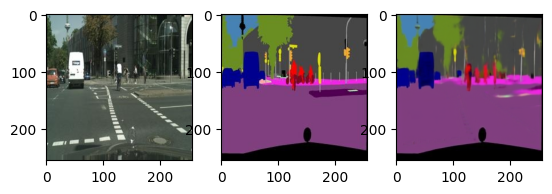

In [ ]:
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(X_valid[32], cv2.COLOR_BGR2RGB))
plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(Y_valid[32], cv2.COLOR_BGR2RGB))
plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(y_tmp[0], cv2.COLOR_BGR2RGB))